In [1]:
%matplotlib inline

In [2]:
import functools

import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import torchvision
import random
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

In [3]:
!nvidia-smi

Tue Dec 21 06:09:35 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 3090    On   | 00000000:1C:00.0 Off |                  N/A |
| 45%   21C    P8     9W / 350W |   4075MiB / 24268MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  GeForce RTX 3090    On   | 00000000:69:00.0 Off |                  N/A |
| 46%   

In [4]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='0'

In [5]:
class SkipConnection(nn.Module):
    def __init__(self, outer_nc, inner_nc, input_nc=None,submodule=None, outermost=False, innermost=False, 
                 norm_layer=nn.BatchNorm2d, use_dropout=False, output_function=nn.Sigmoid):
        super(SkipConnection, self).__init__()
        self.outermost = outermost
        if type(norm_layer) == functools.partial:
            use_bias = norm_layer.func == nn.InstanceNorm2d
        else:
            use_bias = norm_layer == nn.InstanceNorm2d
        if input_nc is None:
            input_nc = outer_nc
        downconv = nn.Conv2d(input_nc, inner_nc, kernel_size=4,
                             stride=2, padding=1, bias=use_bias)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = norm_layer(inner_nc)
        uprelu = nn.ReLU(True)
        upnorm = norm_layer(outer_nc)

        if outermost:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1)
            down = [downconv]
            if output_function == nn.Tanh:
                up = [uprelu, upconv, nn.Tanh()]
            else:
                up = [uprelu, upconv, nn.Sigmoid()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(inner_nc, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=use_bias)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=use_bias)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]

            if use_dropout:
                model = down + [submodule] + up + [nn.Dropout(0.5)]
            else:
                model = down + [submodule] + up

        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

In [6]:
class Generator(nn.Module):
    def __init__(self, input_nc, output_nc, ngf=32,
                 norm_layer=nn.BatchNorm2d, use_dropout=False, output_function=nn.Sigmoid):
        super(Generator, self).__init__()
        # construct unet structure
        unet_block = SkipConnection(ngf * 8, ngf * 8, input_nc=None, submodule=None, norm_layer=norm_layer, innermost=True)
        unet_block = SkipConnection(ngf * 4, ngf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(ngf * 2, ngf * 4, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(ngf, ngf * 2, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(output_nc, ngf, input_nc=input_nc, submodule=unet_block, outermost=True, norm_layer=norm_layer, output_function=output_function)

        self.model = unet_block

    def forward(self, input):
        return self.model(input)

In [7]:
device = torch.device('cuda:0')

In [8]:
# Build ResNet 18 Module 

# https://github.com/kuangliu/pytorch-cifar

import torch
import torch.nn as nn
import torch.nn.functional as F


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, in_planes, planes, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, self.expansion *
                               planes, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(self.expansion*planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = F.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.linear = nn.Linear(512*block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = F.avg_pool2d(out, 4)
        out = out.view(out.size(0), -1)
        out = self.linear(out)
        return out
    
def ResNet18():
    return ResNet(BasicBlock, [2, 2, 2, 2])

In [9]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [10]:
generator = Generator(input_nc=6, output_nc=3)
generator = generator.to(device)
generator.apply(weights_init)

classifier = ResNet18()
classifier = classifier.to(device)
classifier.apply(weights_init)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=

In [11]:
def prepare_dataloader(num_workers=8,
                       train_batch_size=128,
                       eval_batch_size=256):

    train_transform = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
    ])

    test_transform = transforms.Compose([
        transforms.ToTensor(),
    ])

    train_set = torchvision.datasets.CIFAR10(root="data",
                                             train=True,
                                             download=True,
                                             transform=train_transform)
    
    test_set = torchvision.datasets.CIFAR10(root="data",
                                            train=False,
                                            download=True,
                                            transform=test_transform)

    train_sampler = torch.utils.data.RandomSampler(train_set)
    test_sampler = torch.utils.data.SequentialSampler(test_set)

    train_loader = torch.utils.data.DataLoader(dataset=train_set,
                                               batch_size=train_batch_size,
                                               sampler=train_sampler,
                                               num_workers=num_workers)

    test_loader = torch.utils.data.DataLoader(dataset=test_set,
                                              batch_size=eval_batch_size,
                                              sampler=test_sampler,
                                              num_workers=num_workers)

    return train_loader, test_loader

In [12]:
train_loader, test_loader = prepare_dataloader()

Files already downloaded and verified
Files already downloaded and verified


In [13]:
# MSE loss
mse_criterion = nn.MSELoss()

ce_criterion = nn.CrossEntropyLoss()

In [14]:
# optimizerG = optim.Adam(generator.parameters(), lr=0.01, betas=(0.5, 0.999))

# optimizerC = optim.Adam(classifier.parameters(), lr=0.01, betas=(0.5, 0.999))

optimizer = optim.Adam(generator.parameters(), lr=0.01, betas=(0.5, 0.999))
optimizer.add_param_group({'params': classifier.parameters()})

In [15]:
class AverageMeter(object):
    """
    Computes and stores the average and current value.
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [16]:
# transform = transforms.Normalize(mean=(0.485, 0.456, 0.406), 
#                              std=(0.229, 0.224, 0.225))

In [17]:
def show_images(images):
    grid_img = torchvision.utils.make_grid(images, nrow=3)
    plt.imshow(grid_img.permute(1,2,0))
    plt.show()

In [18]:
best_generator_loss = 1

In [19]:
best_classifier_loss = 1

In [20]:
# Training generator 

def train_generator(train_loader, epoch, generator, mse_criterion, cuda=True, show=True):
    generator.train()
    
    g_losses = AverageMeter()
    
    output_images = []

    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()

        # Select half dataset for container images
        pivot = len(image) // 2 
        container_image = image[0:pivot, :, :, :]
        real_image = image[pivot:pivot*2, :, :, :]
        real_label = label[pivot:pivot*2]

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, real_image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            real_image = real_image.to(device)
            real_label = real_label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        privacy_image = generator(gen_input_v)
        
        if i % 100 == 0 and show:
            index = random.randint(0, pivot - 1)
            output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])

        # Calculate loss 
        g_loss = mse_criterion(privacy_image, container_image_v)
        
        # Average loss 
        g_losses.update(g_loss.data, pivot)
        
        # Backward
        g_loss.backward()

        optimizerG.step()
    
    print('Training generator - Epoch {} g_loss = {}'.format(epoch, g_losses.avg))
    # Show some output images
    if show:
        show_images(output_images)

In [21]:
# Training classifier 

def train_classifier(train_loader, epoch, generator, classifier, ce_criterion, cuda=True, show=True):
    generator.eval()
    classifier.train()

    c_losses = AverageMeter() 
    
    correct = 0
    total = 0

    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()
        classifier.zero_grad()
        
        # Select half dataset for container images
        pivot = len(image) 
        container_image = torch.zeros(image.shape)

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            image = image.to(device)
            label = label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        with torch.no_grad():
            privacy_image = generator(gen_input_v)
        print(privacy_image)
        print(privacy_image)
        pred_label = classifier(privacy_image)
        pred_label = pred_label.to(device)

        # Calculate loss 
        c_loss = ce_criterion(pred_label, label)
        
        # Average loss 
        c_losses.update(c_loss.data, pivot)
        
        # Backward
        c_loss.backward()

        optimizerC.step()
        
        # Calculate accuracy
        _, predicted = pred_label.max(1)
        total += label.size(0)
        correct += predicted.eq(label).sum().item()
    
    print('Training classifier - Epoch {} c_loss = {} acc = {}'.format(epoch, c_losses.avg, correct/total))

In [22]:
def test_generator(test_loader, generator, mse_criterion, cuda=True, show=True):    
    global best_generator_loss
    
    generator.eval()
    
    g_losses = AverageMeter() 
    
    output_images = []
    
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            # Select half dataset for container images
            pivot = len(image) // 2 
            container_image = image[0:pivot, :, :, :]
            real_image = image[pivot:pivot*2, :, :, :]
            real_label = label[pivot:pivot*2]

            gen_input = torch.cat([container_image, real_image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                real_image = real_image.to(device)
                real_label = real_label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            
            if i % 100 == 0 and show:
                index = random.randint(0, pivot - 1)
                output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])
            
            # Calculate loss 
            g_loss = mse_criterion(privacy_image, container_image_v)

            # Average loss 
            g_losses.update(g_loss.data, pivot)
    
    
    print('Testing generator - g_loss = {}'.format(g_losses.avg))    
    
    # Save checkpoint 
    if g_losses.avg < best_generator_loss:
        best_generator_loss = g_losses.avg
        torch.save(generator.state_dict(), 'checkpoints/my_best_generator_loss.pth')
        print('Save best checkpoint with loss {}'.format(g_losses.avg))
    # Show some output images
    if show:
        show_images(output_images)        

In [23]:
def test_classifier(test_loader, generator, classifier, ce_criterion, cuda=True, show=True):
    global best_classifier_loss
    generator.eval()
    classifier.eval()
 
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            # Select half dataset for container images
            pivot = len(image) 
            
            container_image = torch.zeros(image.shape)
            
            gen_input = torch.cat([container_image, image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                image = image.to(device)
                label = label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            print('container shape: ', container_image.shape)
            print('original image shape: ', image.shape)
            print('privacy shape: ', privacy_image.shape)
            import pdb; pdb.set_trace()
            pred_label = classifier(privacy_image)
            
            # Calculate loss 
            c_loss = ce_criterion(pred_label, label)

            # Average loss 
            c_losses.update(c_loss.data, pivot)

            # Calculate accuracy
            _, predicted = pred_label.max(1)
            total += label.size(0)
            correct += predicted.eq(label).sum().item()
    
    print('Testing classifier - Epoch {} c_loss = {} acc = {}'.format(epoch, c_losses.avg, correct/total))         
    # Save checkpoint 
    if c_losses.avg < best_classifier_loss:
        best_classifier_loss = c_losses.avg
        torch.save(classifier.state_dict(), 'checkpoints/my_best_classifier_loss.pth')
        print('Save best checkpoint with loss {}'.format(c_losses.avg))

In [24]:
# Training generator first
# for epoch in range(100):
#     show = False
#     if epoch % 20 == 0:
#         show = True
#     train_generator(train_loader, epoch, generator, mse_criterion, show=show)
#     test_generator(test_loader, generator, mse_criterion, show=show)

In [25]:
# generator.load_state_dict(torch.load('checkpoints/best_generator_loss.pth'))

In [26]:
# test_generator(test_loader, generator, mse_criterion, show=True)

In [27]:
# for epoch in range(100):
#     train_classifier(train_loader, epoch, generator, classifier, ce_criterion, cuda=True, show=True)
#     test_classifier(test_loader, generator, classifier, ce_criterion, cuda=True, show=True)

In [28]:
def train_end2end(train_loader, epoch, generator, classifier, mse_criterion, ce_criterion, cuda=True, show=True):
    generator.train()
    classifier.train()
    
    overall_losses = AverageMeter()
    g_losses = AverageMeter()
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    
    output_images = []
    print('Training - Epoch {}'.format(epoch))
    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()
        classifier.zero_grad()

        # Select half dataset for container images
        pivot = len(image) // 2 
        container_image = image[0:pivot, :, :, :]
        real_image = image[pivot:pivot*2, :, :, :]
        label = label[pivot:pivot*2]

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, real_image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            real_image = real_image.to(device)
            label = label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        privacy_image = generator(gen_input_v)
        pred = classifier(privacy_image)
        pred = pred.to(device)
        
        if i % 100 == 0 and show:
            index = random.randint(0, pivot - 1)
            output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])

        # Calculate loss 
        g_loss = mse_criterion(privacy_image, container_image_v)
        c_loss = ce_criterion(pred, label)
        overall_loss = 0.9 * g_loss + 0.1 * c_loss
        
        # Average loss 
        g_losses.update(g_loss.data, pivot)
        c_losses.update(c_loss.data, pivot)
        overall_losses.update(overall_loss.data, pivot)
        
        # Backward
        overall_loss.backward()

        optimizer.step()
        
        # Calculate accuracy
        _, predicted = pred.max(1)
        total += label.size(0)
        correct += predicted.eq(label).sum().item()
    print('overall - overall_loss = {}'.format(overall_losses.avg))
    print('generator - g_loss = {}'.format(g_losses.avg))
    print('classifier - c_loss = {} acc = {}'.format(c_losses.avg, correct/total))
    # Show some output images
    if show:
        show_images(output_images)

In [29]:
best_overall_loss = 100
def test_end2end(test_loader, generator, classifier, ce_criterion, cuda=True, show=True):
    global best_overall_loss
    generator.eval()
    classifier.eval()
 
    overall_losses = AverageMeter()
    g_losses = AverageMeter()
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    output_images = []
    print('Testing - Epoch {}'.format(epoch))
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            pivot = len(image)
            
            container_image = torch.zeros(image.shape)
            
            gen_input = torch.cat([container_image, image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                image = image.to(device)
                label = label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            pred = classifier(privacy_image)
            
            if i % 100 == 0 and show:
                index = random.randint(0, pivot - 1)
                output_images.extend([container_image[index].cpu(), image[index].cpu(), privacy_image[index].cpu()])
            
            # Calculate loss 
            g_loss = mse_criterion(privacy_image, container_image_v)
            c_loss = ce_criterion(pred, label)
            overall_loss = g_loss + c_loss

            # Average loss 
            g_losses.update(g_loss.data, pivot)
            c_losses.update(c_loss.data, pivot)
            overall_losses.update(overall_loss.data, pivot)

            # Calculate accuracy
            _, predicted = pred.max(1)
            total += label.size(0)
            correct += predicted.eq(label).sum().item()
    
    print('overall - overall_loss = {}'.format(overall_losses.avg))
    print('generator - g_loss = {}'.format(g_losses.avg))
    print('classifier - c_loss = {} acc = {}'.format(c_losses.avg, correct/total))      
    # Save checkpoint 
    if overall_losses.avg < best_overall_loss:
        best_overall_loss = overall_losses.avg
        torch.save(generator.state_dict(), 'checkpoints/best_e2e_w91_generator_loss.pth')
        torch.save(classifier.state_dict(), 'checkpoints/best_e2e_w91_classifier_loss.pth')
        print('Save best checkpoint with overall loss {} - g_loss {} - c_loss {}'.format(overall_losses.avg, g_losses.avg, c_losses.avg))
    if show:
        show_images(output_images)

Training - Epoch 0
overall - overall_loss = 0.23137517273426056
generator - g_loss = 0.012210882268846035
classifier - c_loss = 2.2038540840148926 acc = 0.17508


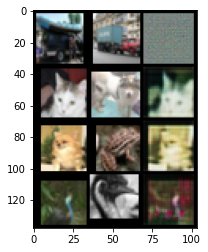

Testing - Epoch 0
overall - overall_loss = 2.301569700241089
generator - g_loss = 0.0025731483474373817
classifier - c_loss = 2.2989964485168457 acc = 0.1443
Save best checkpoint with overall loss 2.301569700241089 - g_loss 0.0025731483474373817 - c_loss 2.2989964485168457


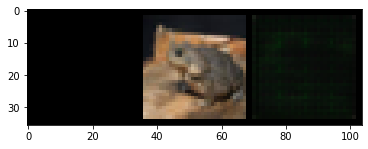

Training - Epoch 1
overall - overall_loss = 0.19590985774993896
generator - g_loss = 0.007474589627236128
classifier - c_loss = 1.8918280601501465 acc = 0.28488


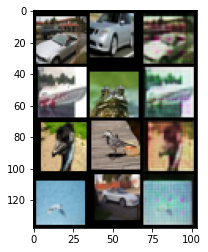

Testing - Epoch 1
overall - overall_loss = 1.9617382287979126
generator - g_loss = 0.010182388126850128
classifier - c_loss = 1.9515562057495117 acc = 0.2679
Save best checkpoint with overall loss 1.9617382287979126 - g_loss 0.010182388126850128 - c_loss 1.9515562057495117


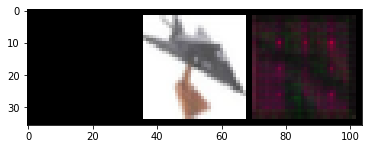

Training - Epoch 2
overall - overall_loss = 0.18060220777988434
generator - g_loss = 0.007504046894609928
classifier - c_loss = 1.7384854555130005 acc = 0.35552


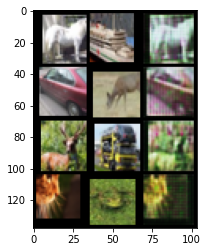

Testing - Epoch 2
overall - overall_loss = 1.769532561302185
generator - g_loss = 0.003330562962219119
classifier - c_loss = 1.7662018537521362 acc = 0.3558
Save best checkpoint with overall loss 1.769532561302185 - g_loss 0.003330562962219119 - c_loss 1.7662018537521362


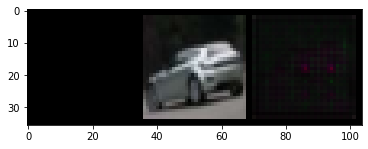

Training - Epoch 3
overall - overall_loss = 0.16924364864826202
generator - g_loss = 0.0070677101612091064
classifier - c_loss = 1.6288259029388428 acc = 0.39748


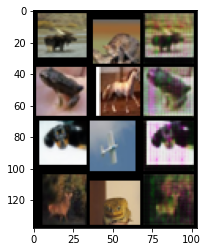

Testing - Epoch 3
overall - overall_loss = 1.6363115310668945
generator - g_loss = 0.005492327734827995
classifier - c_loss = 1.6308189630508423 acc = 0.3917
Save best checkpoint with overall loss 1.6363115310668945 - g_loss 0.005492327734827995 - c_loss 1.6308189630508423


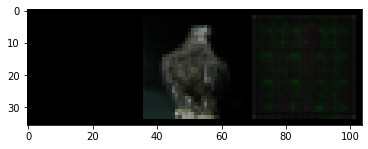

Training - Epoch 4
overall - overall_loss = 0.16103965044021606
generator - g_loss = 0.007100658491253853
classifier - c_loss = 1.5464904308319092 acc = 0.42672


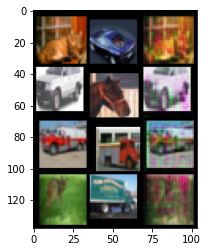

Testing - Epoch 4
overall - overall_loss = 1.488076090812683
generator - g_loss = 0.007127820514142513
classifier - c_loss = 1.4809486865997314 acc = 0.4593
Save best checkpoint with overall loss 1.488076090812683 - g_loss 0.007127820514142513 - c_loss 1.4809486865997314


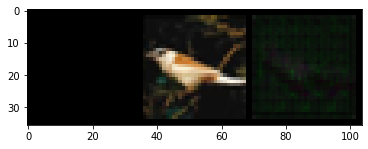

Training - Epoch 5
overall - overall_loss = 0.15421339869499207
generator - g_loss = 0.00720751890912652
classifier - c_loss = 1.477266550064087 acc = 0.45724


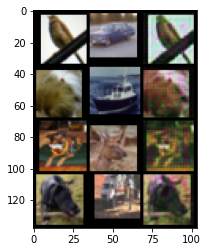

Testing - Epoch 5
overall - overall_loss = 1.5444004535675049
generator - g_loss = 0.005031329579651356
classifier - c_loss = 1.5393692255020142 acc = 0.4267


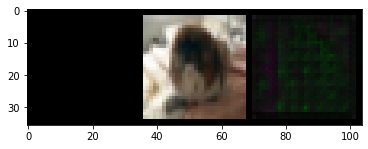

Training - Epoch 6
overall - overall_loss = 0.1459139585494995
generator - g_loss = 0.00727718323469162
classifier - c_loss = 1.39364492893219 acc = 0.49268


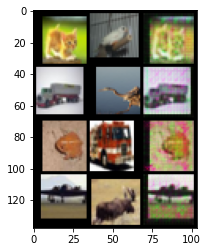

Testing - Epoch 6
overall - overall_loss = 1.3899714946746826
generator - g_loss = 0.0058657280169427395
classifier - c_loss = 1.3841056823730469 acc = 0.4904
Save best checkpoint with overall loss 1.3899714946746826 - g_loss 0.0058657280169427395 - c_loss 1.3841056823730469


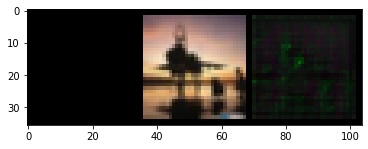

Training - Epoch 7
overall - overall_loss = 0.14056748151779175
generator - g_loss = 0.007058965507894754
classifier - c_loss = 1.3421440124511719 acc = 0.51292


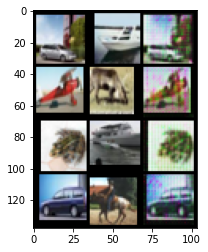

Testing - Epoch 7
overall - overall_loss = 1.325458288192749
generator - g_loss = 0.007843988947570324
classifier - c_loss = 1.3176145553588867 acc = 0.5297
Save best checkpoint with overall loss 1.325458288192749 - g_loss 0.007843988947570324 - c_loss 1.3176145553588867


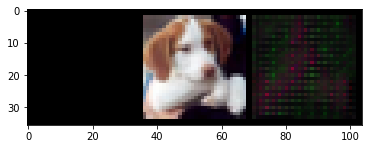

Training - Epoch 8
overall - overall_loss = 0.13593840599060059
generator - g_loss = 0.006969750393182039
classifier - c_loss = 1.2966562509536743 acc = 0.53196


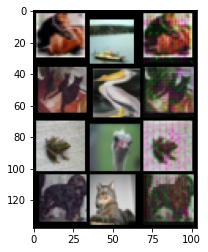

Testing - Epoch 8
overall - overall_loss = 1.207066297531128
generator - g_loss = 0.004857088904827833
classifier - c_loss = 1.2022089958190918 acc = 0.5663
Save best checkpoint with overall loss 1.207066297531128 - g_loss 0.004857088904827833 - c_loss 1.2022089958190918


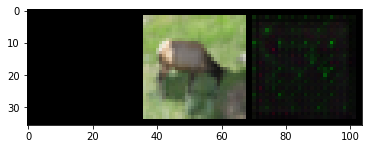

Training - Epoch 9
overall - overall_loss = 0.1289549469947815
generator - g_loss = 0.006941134575754404
classifier - c_loss = 1.227080225944519 acc = 0.56188


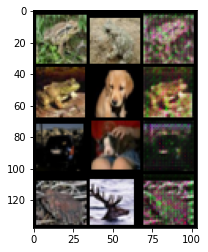

Testing - Epoch 9
overall - overall_loss = 1.287758708000183
generator - g_loss = 0.0025796142872422934
classifier - c_loss = 1.2851790189743042 acc = 0.5393


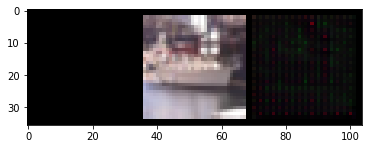

Training - Epoch 10
overall - overall_loss = 0.12388528883457184
generator - g_loss = 0.0074137612245976925
classifier - c_loss = 1.1721291542053223 acc = 0.58004


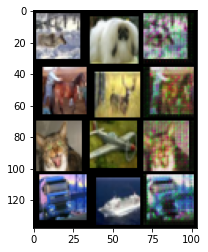

Testing - Epoch 10
overall - overall_loss = 1.2920076847076416
generator - g_loss = 0.002511485479772091
classifier - c_loss = 1.289495825767517 acc = 0.5463


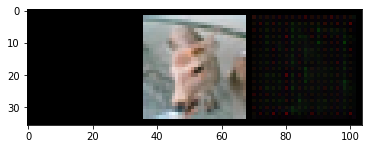

Training - Epoch 11
overall - overall_loss = 0.1192009225487709
generator - g_loss = 0.0073785483837127686
classifier - c_loss = 1.125601887702942 acc = 0.59644


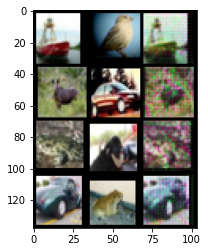

Testing - Epoch 11
overall - overall_loss = 1.0979135036468506
generator - g_loss = 0.006311698816716671
classifier - c_loss = 1.0916019678115845 acc = 0.6088
Save best checkpoint with overall loss 1.0979135036468506 - g_loss 0.006311698816716671 - c_loss 1.0916019678115845


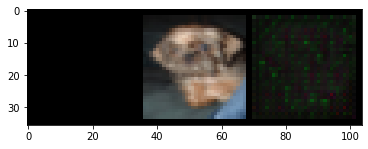

Training - Epoch 12
overall - overall_loss = 0.11352495104074478
generator - g_loss = 0.007544087246060371
classifier - c_loss = 1.0673519372940063 acc = 0.6178


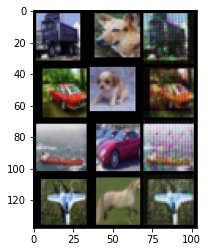

Testing - Epoch 12
overall - overall_loss = 1.079787015914917
generator - g_loss = 0.006057932507246733
classifier - c_loss = 1.0737286806106567 acc = 0.6197
Save best checkpoint with overall loss 1.079787015914917 - g_loss 0.006057932507246733 - c_loss 1.0737286806106567


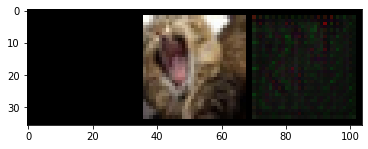

Training - Epoch 13
overall - overall_loss = 0.10759765654802322
generator - g_loss = 0.007469288073480129
classifier - c_loss = 1.008752703666687 acc = 0.64088


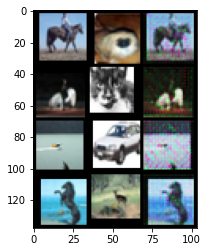

Testing - Epoch 13
overall - overall_loss = 1.1442114114761353
generator - g_loss = 0.004459012299776077
classifier - c_loss = 1.1397521495819092 acc = 0.6065


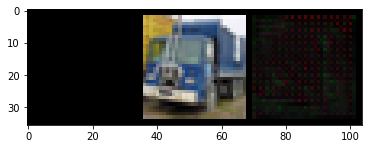

Training - Epoch 14
overall - overall_loss = 0.10234468430280685
generator - g_loss = 0.007835852913558483
classifier - c_loss = 0.9529249668121338 acc = 0.66508


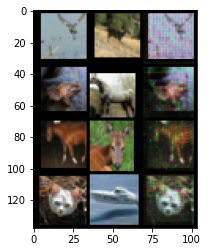

Testing - Epoch 14
overall - overall_loss = 1.2543656826019287
generator - g_loss = 0.002835743362084031
classifier - c_loss = 1.2515298128128052 acc = 0.5833


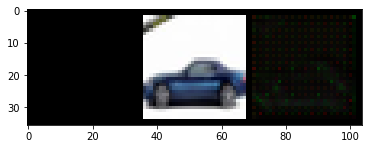

Training - Epoch 15
overall - overall_loss = 0.09667319059371948
generator - g_loss = 0.007486733142286539
classifier - c_loss = 0.8993509411811829 acc = 0.68308


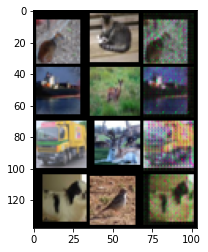

Testing - Epoch 15
overall - overall_loss = 1.0575827360153198
generator - g_loss = 0.005142004229128361
classifier - c_loss = 1.0524406433105469 acc = 0.6336
Save best checkpoint with overall loss 1.0575827360153198 - g_loss 0.005142004229128361 - c_loss 1.0524406433105469


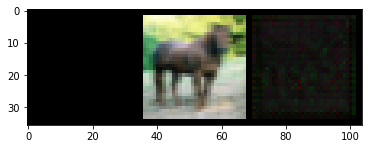

Training - Epoch 16
overall - overall_loss = 0.09391746670007706
generator - g_loss = 0.007545084692537785
classifier - c_loss = 0.8712700009346008 acc = 0.69176


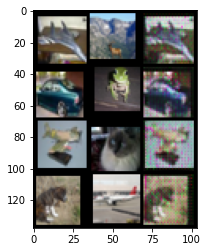

Testing - Epoch 16
overall - overall_loss = 0.9123854041099548
generator - g_loss = 0.004505431745201349
classifier - c_loss = 0.9078798890113831 acc = 0.6849
Save best checkpoint with overall loss 0.9123854041099548 - g_loss 0.004505431745201349 - c_loss 0.9078798890113831


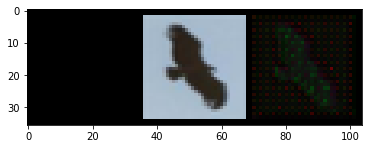

Training - Epoch 17
overall - overall_loss = 0.09000986814498901
generator - g_loss = 0.007767865899950266
classifier - c_loss = 0.8301883339881897 acc = 0.70648


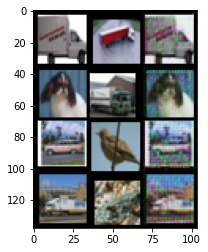

Testing - Epoch 17
overall - overall_loss = 0.9786357283592224
generator - g_loss = 0.0024475054815411568
classifier - c_loss = 0.9761882424354553 acc = 0.657


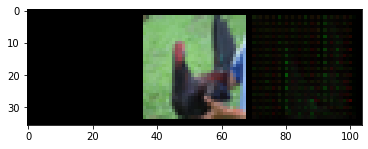

Training - Epoch 18
overall - overall_loss = 0.08636026829481125
generator - g_loss = 0.007580609526485205
classifier - c_loss = 0.7953770160675049 acc = 0.72144


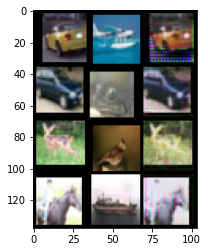

Testing - Epoch 18
overall - overall_loss = 0.830797553062439
generator - g_loss = 0.004834873601794243
classifier - c_loss = 0.8259626626968384 acc = 0.7085
Save best checkpoint with overall loss 0.830797553062439 - g_loss 0.004834873601794243 - c_loss 0.8259626626968384


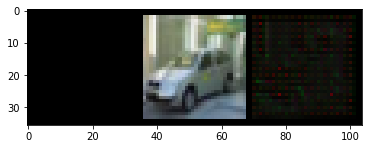

Training - Epoch 19
overall - overall_loss = 0.08429094403982162
generator - g_loss = 0.007420380134135485
classifier - c_loss = 0.776125967502594 acc = 0.72572


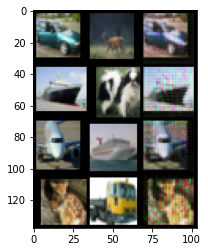

Testing - Epoch 19
overall - overall_loss = 1.0704286098480225
generator - g_loss = 0.0028089405968785286
classifier - c_loss = 1.0676199197769165 acc = 0.6457


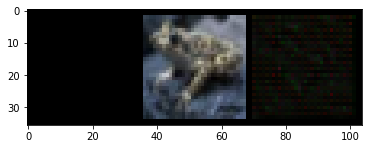

Training - Epoch 20
overall - overall_loss = 0.08151227980852127
generator - g_loss = 0.007362396456301212
classifier - c_loss = 0.74886155128479 acc = 0.7372


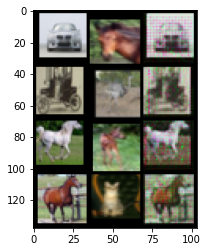

Testing - Epoch 20
overall - overall_loss = 0.984710156917572
generator - g_loss = 0.0020966276060789824
classifier - c_loss = 0.9826135635375977 acc = 0.661


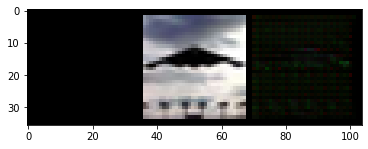

Training - Epoch 21
overall - overall_loss = 0.0795634388923645
generator - g_loss = 0.007436081301420927
classifier - c_loss = 0.7287094593048096 acc = 0.74264


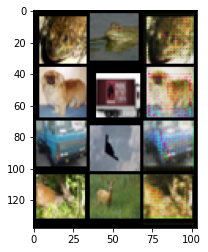

Testing - Epoch 21
overall - overall_loss = 0.7734126448631287
generator - g_loss = 0.0036513465456664562
classifier - c_loss = 0.7697612047195435 acc = 0.7333
Save best checkpoint with overall loss 0.7734126448631287 - g_loss 0.0036513465456664562 - c_loss 0.7697612047195435


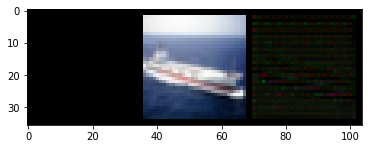

Training - Epoch 22
overall - overall_loss = 0.07794976234436035
generator - g_loss = 0.007147681899368763
classifier - c_loss = 0.7151684761047363 acc = 0.74944


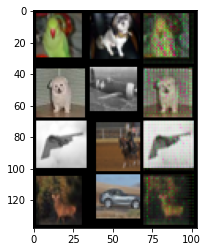

Testing - Epoch 22
overall - overall_loss = 0.7843539118766785
generator - g_loss = 0.0018703406676650047
classifier - c_loss = 0.7824835777282715 acc = 0.7324


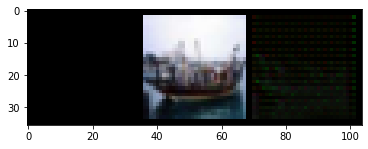

Training - Epoch 23
overall - overall_loss = 0.07639938592910767
generator - g_loss = 0.007187906187027693
classifier - c_loss = 0.6993025541305542 acc = 0.7556


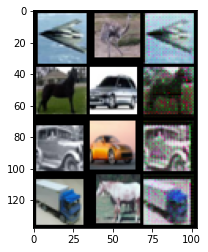

Testing - Epoch 23
overall - overall_loss = 0.7654222846031189
generator - g_loss = 0.0044951713643968105
classifier - c_loss = 0.7609270811080933 acc = 0.7354
Save best checkpoint with overall loss 0.7654222846031189 - g_loss 0.0044951713643968105 - c_loss 0.7609270811080933


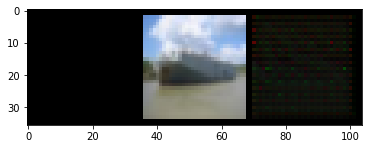

Training - Epoch 24
overall - overall_loss = 0.07482486963272095
generator - g_loss = 0.007011701352894306
classifier - c_loss = 0.6851430535316467 acc = 0.75988


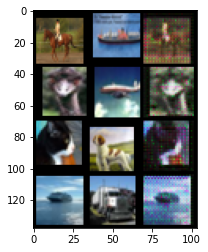

Testing - Epoch 24
overall - overall_loss = 0.8013449311256409
generator - g_loss = 0.0015928730135783553
classifier - c_loss = 0.7997521758079529 acc = 0.7285


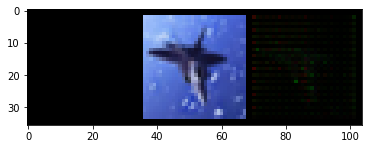

Training - Epoch 25
overall - overall_loss = 0.07343246042728424
generator - g_loss = 0.00691008847206831
classifier - c_loss = 0.67213374376297 acc = 0.76472


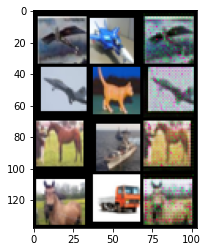

Testing - Epoch 25
overall - overall_loss = 0.8083388209342957
generator - g_loss = 0.004155608359724283
classifier - c_loss = 0.8041831254959106 acc = 0.7295


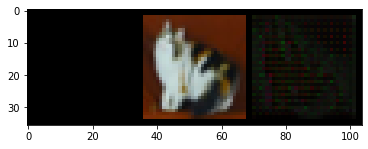

Training - Epoch 26
overall - overall_loss = 0.07189474254846573
generator - g_loss = 0.007270180620253086
classifier - c_loss = 0.653515636920929 acc = 0.76816


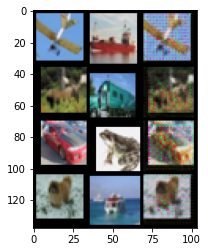

Testing - Epoch 26
overall - overall_loss = 0.8698790669441223
generator - g_loss = 0.005441358778625727
classifier - c_loss = 0.8644377589225769 acc = 0.7192


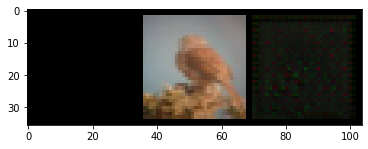

Training - Epoch 27
overall - overall_loss = 0.07058587670326233
generator - g_loss = 0.007338460069149733
classifier - c_loss = 0.6398128271102905 acc = 0.77644


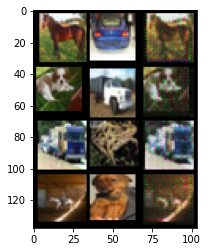

Testing - Epoch 27
overall - overall_loss = 0.8251233100891113
generator - g_loss = 0.004671975038945675
classifier - c_loss = 0.8204514384269714 acc = 0.7167


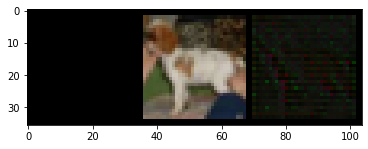

Training - Epoch 28
overall - overall_loss = 0.06890473514795303
generator - g_loss = 0.006945883389562368
classifier - c_loss = 0.626534104347229 acc = 0.7806


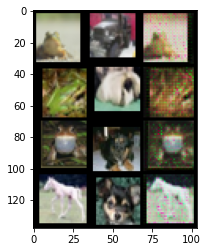

Testing - Epoch 28
overall - overall_loss = 0.7179203629493713
generator - g_loss = 0.006001858972012997
classifier - c_loss = 0.7119185328483582 acc = 0.7532
Save best checkpoint with overall loss 0.7179203629493713 - g_loss 0.006001858972012997 - c_loss 0.7119185328483582


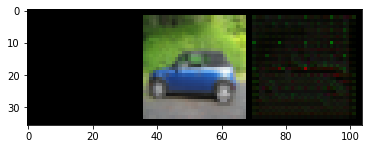

Training - Epoch 29
overall - overall_loss = 0.06589650362730026
generator - g_loss = 0.006894102785736322
classifier - c_loss = 0.5969183444976807 acc = 0.79012


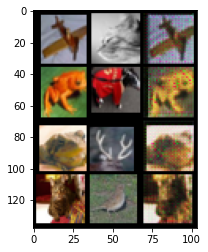

Testing - Epoch 29
overall - overall_loss = 0.7609087228775024
generator - g_loss = 0.008134507574141026
classifier - c_loss = 0.752774178981781 acc = 0.7503


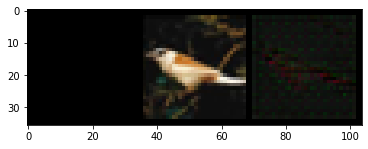

Training - Epoch 30
overall - overall_loss = 0.06587986648082733
generator - g_loss = 0.0070001170970499516
classifier - c_loss = 0.5957971811294556 acc = 0.79068


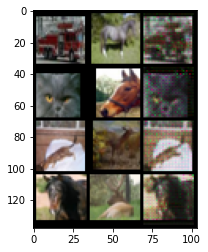

Testing - Epoch 30
overall - overall_loss = 0.7108004093170166
generator - g_loss = 0.0049058059230446815
classifier - c_loss = 0.7058945894241333 acc = 0.7593
Save best checkpoint with overall loss 0.7108004093170166 - g_loss 0.0049058059230446815 - c_loss 0.7058945894241333


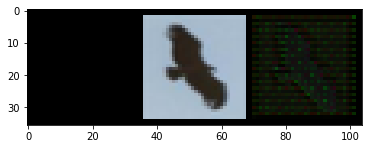

Training - Epoch 31
overall - overall_loss = 0.06536798924207687
generator - g_loss = 0.0070489998906850815
classifier - c_loss = 0.5902390480041504 acc = 0.79356


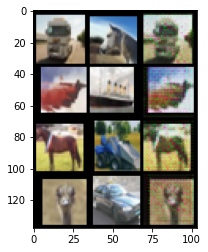

Testing - Epoch 31
overall - overall_loss = 0.7212085723876953
generator - g_loss = 0.003298769239336252
classifier - c_loss = 0.7179098725318909 acc = 0.753


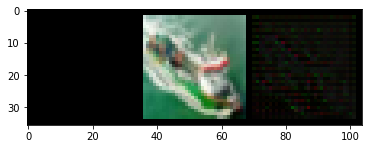

Training - Epoch 32
overall - overall_loss = 0.06300313025712967
generator - g_loss = 0.006730259396135807
classifier - c_loss = 0.569459080696106 acc = 0.80132


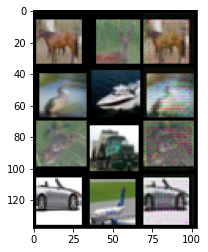

Testing - Epoch 32
overall - overall_loss = 0.8514606952667236
generator - g_loss = 0.0025087192188948393
classifier - c_loss = 0.8489519357681274 acc = 0.7232


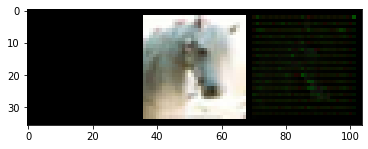

Training - Epoch 33
overall - overall_loss = 0.0632423534989357
generator - g_loss = 0.006740634795278311
classifier - c_loss = 0.5717580914497375 acc = 0.80064


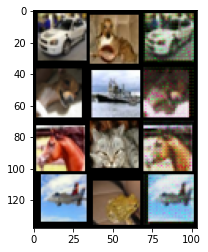

Testing - Epoch 33
overall - overall_loss = 0.7117369771003723
generator - g_loss = 0.008278291672468185
classifier - c_loss = 0.7034586071968079 acc = 0.762


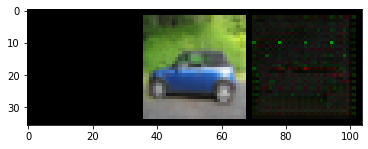

Training - Epoch 34
overall - overall_loss = 0.06152307987213135
generator - g_loss = 0.0069767446257174015
classifier - c_loss = 0.5524404644966125 acc = 0.80472


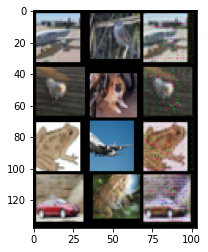

Testing - Epoch 34
overall - overall_loss = 0.6835387945175171
generator - g_loss = 0.008787784725427628
classifier - c_loss = 0.6747511625289917 acc = 0.774
Save best checkpoint with overall loss 0.6835387945175171 - g_loss 0.008787784725427628 - c_loss 0.6747511625289917


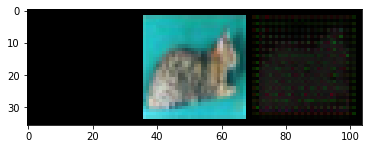

Training - Epoch 35
overall - overall_loss = 0.06070028990507126
generator - g_loss = 0.006936815567314625
classifier - c_loss = 0.5445713996887207 acc = 0.80596


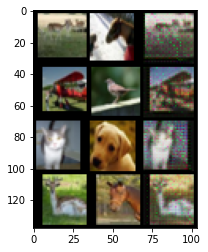

Testing - Epoch 35
overall - overall_loss = 0.8266202807426453
generator - g_loss = 0.003684882540255785
classifier - c_loss = 0.8229353427886963 acc = 0.737


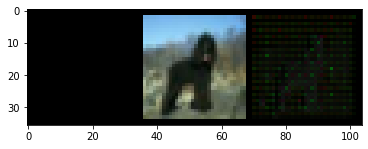

Training - Epoch 36
overall - overall_loss = 0.0597510039806366
generator - g_loss = 0.006868971977382898
classifier - c_loss = 0.5356889963150024 acc = 0.81072


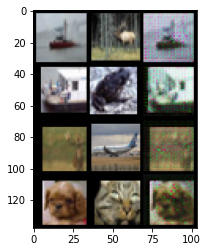

Testing - Epoch 36
overall - overall_loss = 0.6737967133522034
generator - g_loss = 0.00581232039257884
classifier - c_loss = 0.6679843068122864 acc = 0.773
Save best checkpoint with overall loss 0.6737967133522034 - g_loss 0.00581232039257884 - c_loss 0.6679843068122864


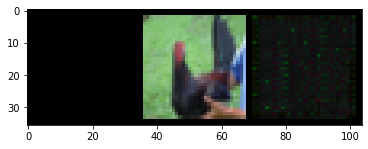

Training - Epoch 37
overall - overall_loss = 0.05859345570206642
generator - g_loss = 0.006804978009313345
classifier - c_loss = 0.5246896147727966 acc = 0.81468


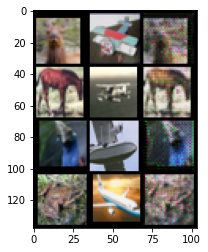

Testing - Epoch 37
overall - overall_loss = 0.7915340662002563
generator - g_loss = 0.004569507669657469
classifier - c_loss = 0.7869646549224854 acc = 0.7385


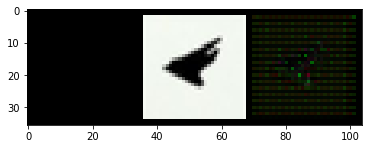

Training - Epoch 38
overall - overall_loss = 0.05708497017621994
generator - g_loss = 0.006688899360597134
classifier - c_loss = 0.5106496810913086 acc = 0.82


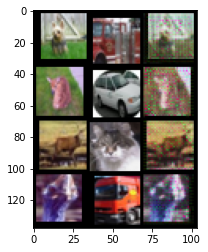

Testing - Epoch 38
overall - overall_loss = 0.7350398302078247
generator - g_loss = 0.0051073068752884865
classifier - c_loss = 0.7299324870109558 acc = 0.7594


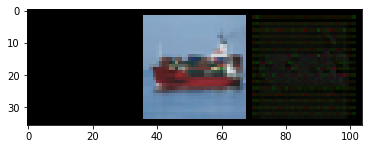

Training - Epoch 39
overall - overall_loss = 0.056340157985687256
generator - g_loss = 0.006808473262935877
classifier - c_loss = 0.5021252036094666 acc = 0.8242


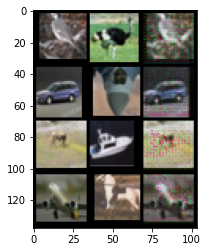

Testing - Epoch 39
overall - overall_loss = 0.6695834994316101
generator - g_loss = 0.0019974156748503447
classifier - c_loss = 0.6675860285758972 acc = 0.7747
Save best checkpoint with overall loss 0.6695834994316101 - g_loss 0.0019974156748503447 - c_loss 0.6675860285758972


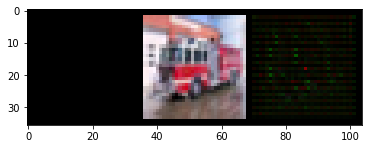

Training - Epoch 40
overall - overall_loss = 0.05522533133625984
generator - g_loss = 0.006717611104249954
classifier - c_loss = 0.49179506301879883 acc = 0.82896


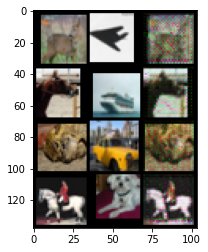

Testing - Epoch 40
overall - overall_loss = 0.6864132285118103
generator - g_loss = 0.007280393037945032
classifier - c_loss = 0.6791328191757202 acc = 0.7732


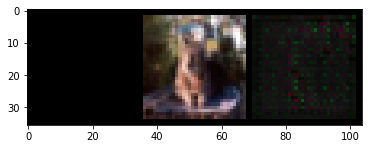

Training - Epoch 41
overall - overall_loss = 0.05496794357895851
generator - g_loss = 0.006606203969568014
classifier - c_loss = 0.49022355675697327 acc = 0.82464


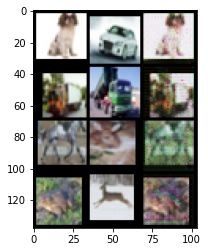

Testing - Epoch 41
overall - overall_loss = 0.689671516418457
generator - g_loss = 0.004071616102010012
classifier - c_loss = 0.6855999827384949 acc = 0.7643


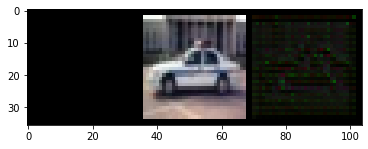

Training - Epoch 42
overall - overall_loss = 0.05393318086862564
generator - g_loss = 0.00694568594917655
classifier - c_loss = 0.47682076692581177 acc = 0.83388


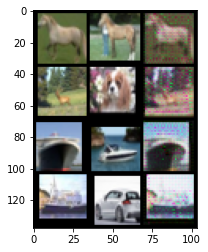

Testing - Epoch 42
overall - overall_loss = 0.735673725605011
generator - g_loss = 0.0100783696398139
classifier - c_loss = 0.7255952954292297 acc = 0.7585


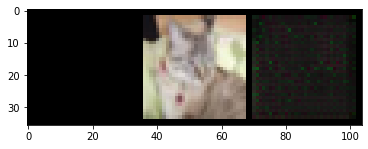

Training - Epoch 43
overall - overall_loss = 0.053243134170770645
generator - g_loss = 0.006902862340211868
classifier - c_loss = 0.4703056216239929 acc = 0.83528


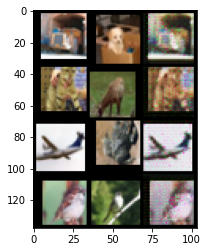

Testing - Epoch 43
overall - overall_loss = 0.7425118088722229
generator - g_loss = 0.005264594219624996
classifier - c_loss = 0.7372471690177917 acc = 0.7608


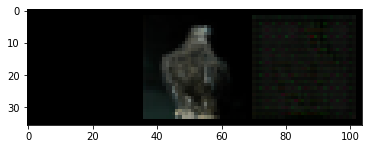

Training - Epoch 44
overall - overall_loss = 0.05196173116564751
generator - g_loss = 0.006834571249783039
classifier - c_loss = 0.45810624957084656 acc = 0.83972


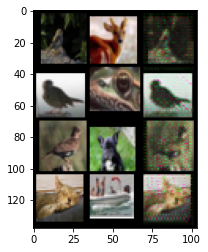

Testing - Epoch 44
overall - overall_loss = 0.7015183568000793
generator - g_loss = 0.0036075308453291655
classifier - c_loss = 0.6979108452796936 acc = 0.7702


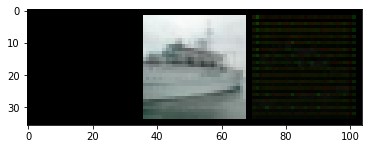

Training - Epoch 45
overall - overall_loss = 0.051515888422727585
generator - g_loss = 0.00679395068436861
classifier - c_loss = 0.4540131986141205 acc = 0.84288


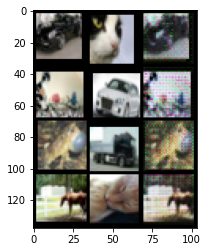

Testing - Epoch 45
overall - overall_loss = 0.6318613886833191
generator - g_loss = 0.0023411561269313097
classifier - c_loss = 0.6295202970504761 acc = 0.7922
Save best checkpoint with overall loss 0.6318613886833191 - g_loss 0.0023411561269313097 - c_loss 0.6295202970504761


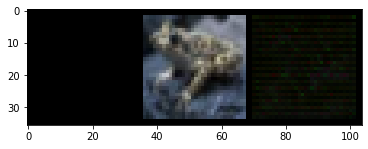

Training - Epoch 46
overall - overall_loss = 0.050355128943920135
generator - g_loss = 0.006730658933520317
classifier - c_loss = 0.4429750144481659 acc = 0.84432


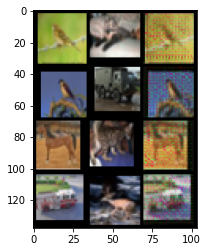

Testing - Epoch 46
overall - overall_loss = 0.6472679376602173
generator - g_loss = 0.002819746034219861
classifier - c_loss = 0.6444481015205383 acc = 0.7852


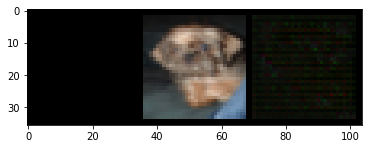

Training - Epoch 47
overall - overall_loss = 0.049814119935035706
generator - g_loss = 0.006859097629785538
classifier - c_loss = 0.43640947341918945 acc = 0.84676


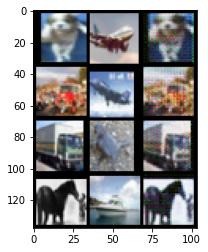

Testing - Epoch 47
overall - overall_loss = 0.710417628288269
generator - g_loss = 0.0029581591952592134
classifier - c_loss = 0.7074595093727112 acc = 0.7697


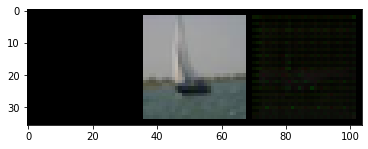

Training - Epoch 48
overall - overall_loss = 0.049204807728528976
generator - g_loss = 0.0066569955088198185
classifier - c_loss = 0.43213513493537903 acc = 0.84884


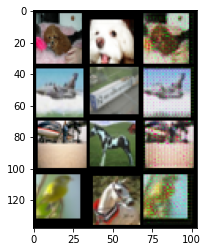

Testing - Epoch 48
overall - overall_loss = 0.6730520129203796
generator - g_loss = 0.006099598482251167
classifier - c_loss = 0.6669523119926453 acc = 0.7846


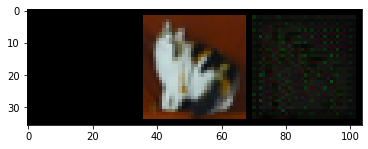

Training - Epoch 49
overall - overall_loss = 0.048297982662916183
generator - g_loss = 0.006625066976994276
classifier - c_loss = 0.4233536124229431 acc = 0.84936


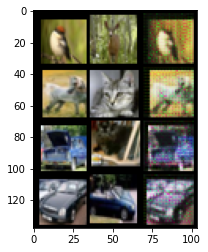

Testing - Epoch 49
overall - overall_loss = 0.6871454119682312
generator - g_loss = 0.0064452290534973145
classifier - c_loss = 0.6807000637054443 acc = 0.7778


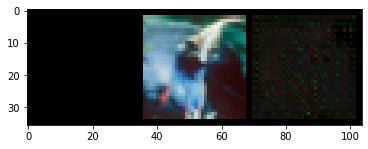

Training - Epoch 50
overall - overall_loss = 0.04757746309041977
generator - g_loss = 0.006749356631189585
classifier - c_loss = 0.4150305688381195 acc = 0.85244


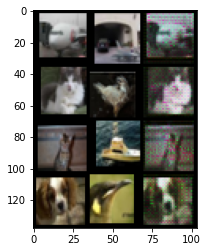

Testing - Epoch 50
overall - overall_loss = 0.6281191110610962
generator - g_loss = 0.007383923977613449
classifier - c_loss = 0.6207350492477417 acc = 0.7959
Save best checkpoint with overall loss 0.6281191110610962 - g_loss 0.007383923977613449 - c_loss 0.6207350492477417


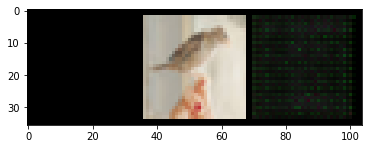

Training - Epoch 51
overall - overall_loss = 0.04727433621883392
generator - g_loss = 0.006855606101453304
classifier - c_loss = 0.41104283928871155 acc = 0.85556


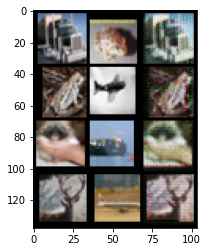

Testing - Epoch 51
overall - overall_loss = 0.6631760001182556
generator - g_loss = 0.006988412234932184
classifier - c_loss = 0.6561875939369202 acc = 0.7909


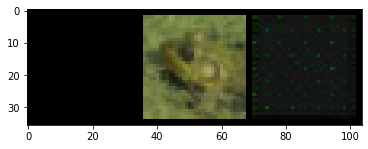

Training - Epoch 52
overall - overall_loss = 0.046979162842035294
generator - g_loss = 0.006855325307697058
classifier - c_loss = 0.40809404850006104 acc = 0.85704


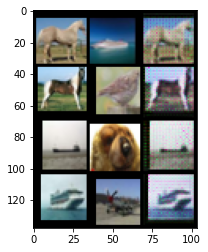

Testing - Epoch 52
overall - overall_loss = 0.6310989856719971
generator - g_loss = 0.003010090673342347
classifier - c_loss = 0.6280889511108398 acc = 0.7961


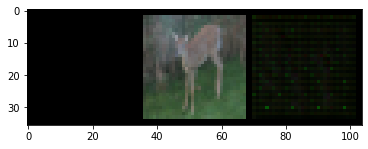

Training - Epoch 53
overall - overall_loss = 0.04566095769405365
generator - g_loss = 0.0067834206856787205
classifier - c_loss = 0.3955588638782501 acc = 0.86156


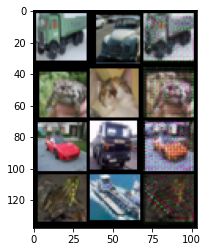

Testing - Epoch 53
overall - overall_loss = 0.7552332878112793
generator - g_loss = 0.0015907640336081386
classifier - c_loss = 0.7536423206329346 acc = 0.7617


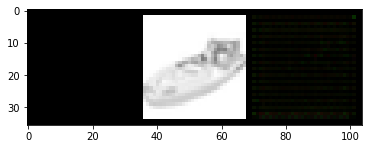

Training - Epoch 54
overall - overall_loss = 0.0450839102268219
generator - g_loss = 0.0068015726283192635
classifier - c_loss = 0.389624685049057 acc = 0.85856


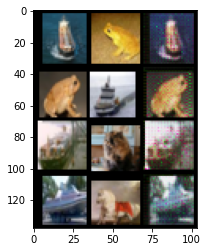

Testing - Epoch 54
overall - overall_loss = 0.7025555372238159
generator - g_loss = 0.006801017560064793
classifier - c_loss = 0.6957545876502991 acc = 0.7853


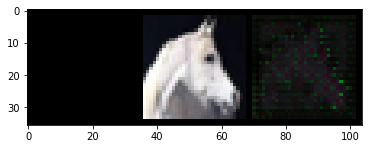

Training - Epoch 55
overall - overall_loss = 0.04367872327566147
generator - g_loss = 0.006854949984699488
classifier - c_loss = 0.37509292364120483 acc = 0.86704


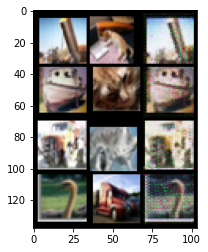

Testing - Epoch 55
overall - overall_loss = 0.7078298926353455
generator - g_loss = 0.0040769390761852264
classifier - c_loss = 0.7037531137466431 acc = 0.7844


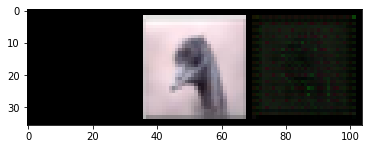

Training - Epoch 56
overall - overall_loss = 0.04327034577727318
generator - g_loss = 0.00692968163639307
classifier - c_loss = 0.37033650279045105 acc = 0.87128


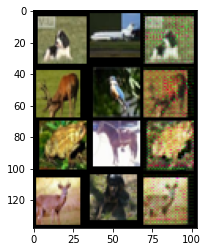

Testing - Epoch 56
overall - overall_loss = 0.6111161708831787
generator - g_loss = 0.006233705207705498
classifier - c_loss = 0.6048824787139893 acc = 0.7971
Save best checkpoint with overall loss 0.6111161708831787 - g_loss 0.006233705207705498 - c_loss 0.6048824787139893


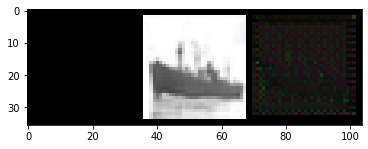

Training - Epoch 57
overall - overall_loss = 0.04310292750597
generator - g_loss = 0.0067808679305016994
classifier - c_loss = 0.3700014054775238 acc = 0.87068


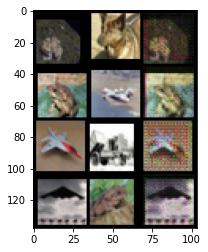

Testing - Epoch 57
overall - overall_loss = 0.6608182787895203
generator - g_loss = 0.0025649752933532
classifier - c_loss = 0.6582533717155457 acc = 0.785


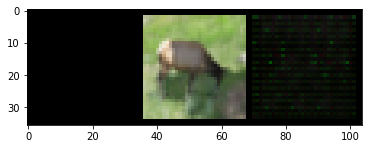

Training - Epoch 58
overall - overall_loss = 0.0414150133728981
generator - g_loss = 0.007051760796457529
classifier - c_loss = 0.35068419575691223 acc = 0.87556


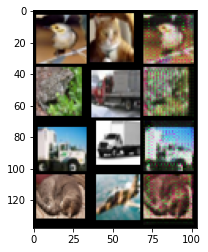

Testing - Epoch 58
overall - overall_loss = 0.6338080763816833
generator - g_loss = 0.003933184780180454
classifier - c_loss = 0.6298748254776001 acc = 0.8074


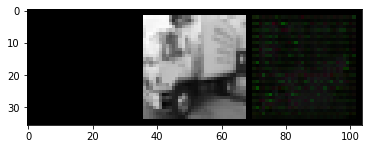

Training - Epoch 59
overall - overall_loss = 0.04132991284132004
generator - g_loss = 0.006797485053539276
classifier - c_loss = 0.3521217107772827 acc = 0.87336


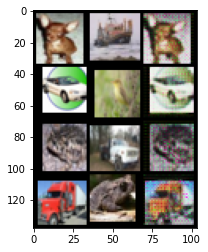

Testing - Epoch 59
overall - overall_loss = 0.6455533504486084
generator - g_loss = 0.001806487562134862
classifier - c_loss = 0.6437468528747559 acc = 0.8002


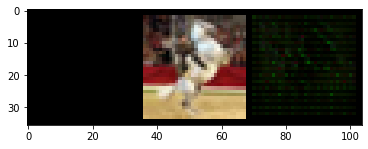

Training - Epoch 60
overall - overall_loss = 0.040399182587862015
generator - g_loss = 0.0067888167686760426
classifier - c_loss = 0.34289222955703735 acc = 0.8778


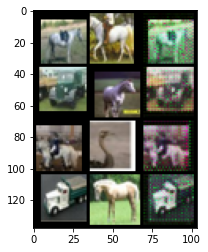

Testing - Epoch 60
overall - overall_loss = 0.6361646056175232
generator - g_loss = 0.00538988271728158
classifier - c_loss = 0.6307744383811951 acc = 0.8008


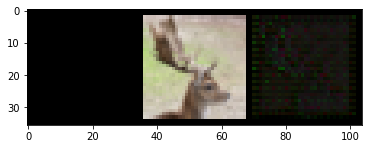

Training - Epoch 61
overall - overall_loss = 0.039647091180086136
generator - g_loss = 0.006945849861949682
classifier - c_loss = 0.333958238363266 acc = 0.88272


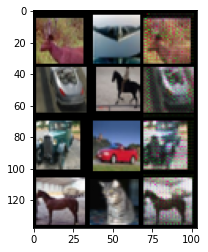

Testing - Epoch 61
overall - overall_loss = 0.6660957336425781
generator - g_loss = 0.004732970613986254
classifier - c_loss = 0.6613627672195435 acc = 0.7987


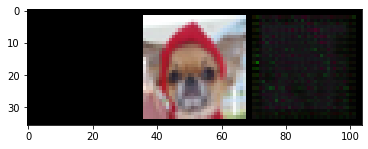

Training - Epoch 62
overall - overall_loss = 0.039921436458826065
generator - g_loss = 0.007233206182718277
classifier - c_loss = 0.3341154456138611 acc = 0.88112


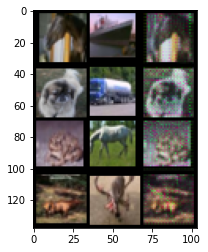

Testing - Epoch 62
overall - overall_loss = 0.7085206508636475
generator - g_loss = 0.0054360381327569485
classifier - c_loss = 0.7030845284461975 acc = 0.7909


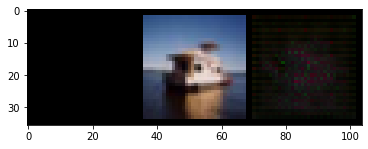

Training - Epoch 63
overall - overall_loss = 0.038649700582027435
generator - g_loss = 0.006893995217978954
classifier - c_loss = 0.3244514465332031 acc = 0.88488


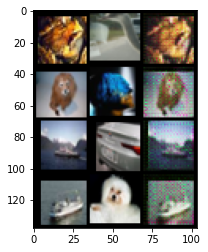

Testing - Epoch 63
overall - overall_loss = 0.6446963548660278
generator - g_loss = 0.004895003978163004
classifier - c_loss = 0.6398013830184937 acc = 0.7993


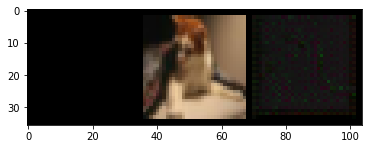

Training - Epoch 64
overall - overall_loss = 0.038021933287382126
generator - g_loss = 0.006814463995397091
classifier - c_loss = 0.31888917088508606 acc = 0.88644


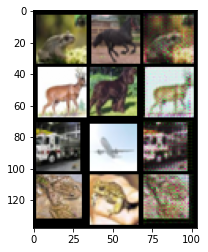

Testing - Epoch 64
overall - overall_loss = 0.6660404801368713
generator - g_loss = 0.003187682945281267
classifier - c_loss = 0.6628528833389282 acc = 0.7977


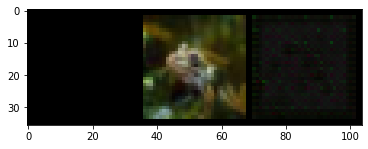

Training - Epoch 65
overall - overall_loss = 0.03830249607563019
generator - g_loss = 0.006923032458871603
classifier - c_loss = 0.32071781158447266 acc = 0.88716


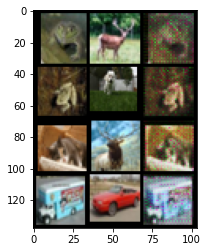

Testing - Epoch 65
overall - overall_loss = 0.6681591868400574
generator - g_loss = 0.0014815405011177063
classifier - c_loss = 0.6666775941848755 acc = 0.7918


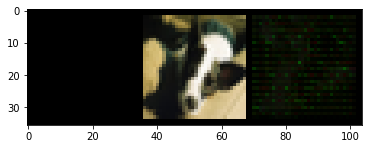

Training - Epoch 66
overall - overall_loss = 0.037340305745601654
generator - g_loss = 0.0069813840091228485
classifier - c_loss = 0.31057044863700867 acc = 0.88924


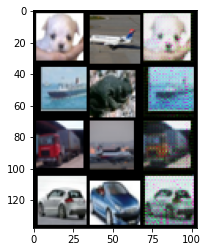

Testing - Epoch 66
overall - overall_loss = 0.6290642023086548
generator - g_loss = 0.006341961678117514
classifier - c_loss = 0.6227221488952637 acc = 0.8056


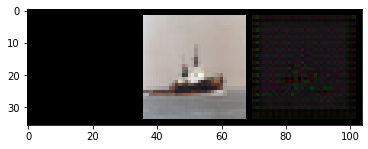

Training - Epoch 67
overall - overall_loss = 0.03472786769270897
generator - g_loss = 0.006784005556255579
classifier - c_loss = 0.28622257709503174 acc = 0.90036


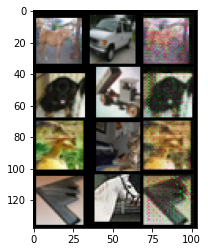

Testing - Epoch 67
overall - overall_loss = 0.7276262640953064
generator - g_loss = 0.0013621392427012324
classifier - c_loss = 0.7262641191482544 acc = 0.7776


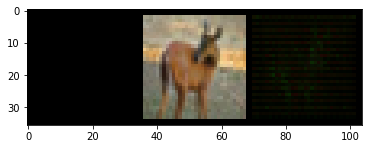

Training - Epoch 68
overall - overall_loss = 0.03636248782277107
generator - g_loss = 0.0072117955423891544
classifier - c_loss = 0.29871895909309387 acc = 0.89576


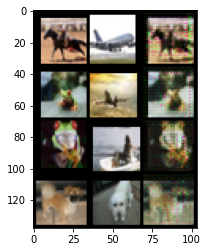

Testing - Epoch 68
overall - overall_loss = 0.647516667842865
generator - g_loss = 0.004533479455858469
classifier - c_loss = 0.6429832577705383 acc = 0.8113


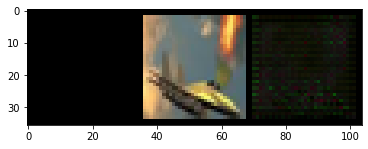

Training - Epoch 69
overall - overall_loss = 0.035384077578783035
generator - g_loss = 0.006942812819033861
classifier - c_loss = 0.2913554012775421 acc = 0.8966


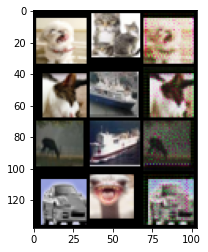

Testing - Epoch 69
overall - overall_loss = 0.7288419604301453
generator - g_loss = 0.007778446190059185
classifier - c_loss = 0.7210634350776672 acc = 0.7942


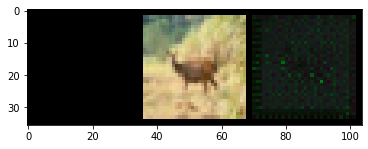

Training - Epoch 70
overall - overall_loss = 0.036029502749443054
generator - g_loss = 0.007235210854560137
classifier - c_loss = 0.29517826437950134 acc = 0.89652


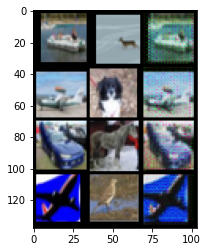

Testing - Epoch 70
overall - overall_loss = 0.6360253691673279
generator - g_loss = 0.006496230140328407
classifier - c_loss = 0.6295291185379028 acc = 0.8026


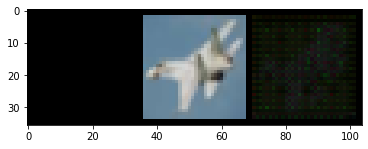

Training - Epoch 71
overall - overall_loss = 0.03452553600072861
generator - g_loss = 0.006940269377082586
classifier - c_loss = 0.2827931046485901 acc = 0.897


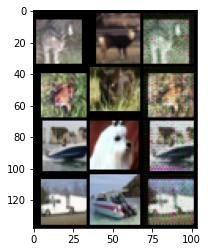

Testing - Epoch 71
overall - overall_loss = 0.6305866241455078
generator - g_loss = 0.00456984294578433
classifier - c_loss = 0.6260167956352234 acc = 0.8211


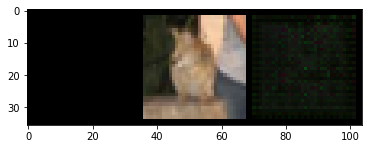

Training - Epoch 72
overall - overall_loss = 0.03417302295565605
generator - g_loss = 0.007039167918264866
classifier - c_loss = 0.2783776819705963 acc = 0.90108


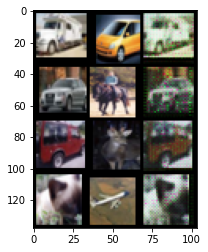

Testing - Epoch 72
overall - overall_loss = 0.6696773171424866
generator - g_loss = 0.004716961644589901
classifier - c_loss = 0.6649602651596069 acc = 0.8048


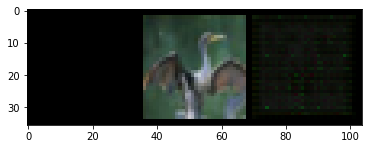

Training - Epoch 73
overall - overall_loss = 0.033420540392398834
generator - g_loss = 0.006875584367662668
classifier - c_loss = 0.2723252475261688 acc = 0.90424


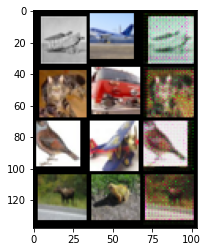

Testing - Epoch 73
overall - overall_loss = 0.6395981907844543
generator - g_loss = 0.003607322694733739
classifier - c_loss = 0.6359909176826477 acc = 0.8117


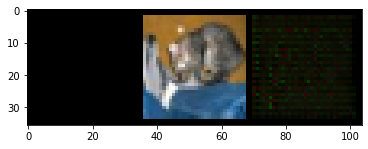

Training - Epoch 74
overall - overall_loss = 0.03407904878258705
generator - g_loss = 0.007324470207095146
classifier - c_loss = 0.2748703956604004 acc = 0.90172


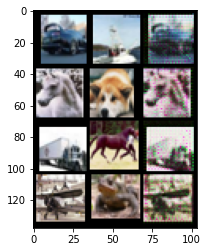

Testing - Epoch 74
overall - overall_loss = 0.626663327217102
generator - g_loss = 0.005524300970137119
classifier - c_loss = 0.6211389303207397 acc = 0.815


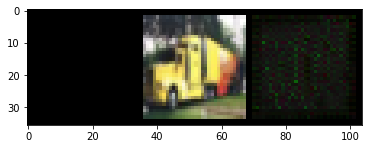

Training - Epoch 75
overall - overall_loss = 0.03220095857977867
generator - g_loss = 0.0067621637135744095
classifier - c_loss = 0.26115018129348755 acc = 0.90664


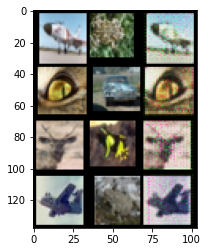

Testing - Epoch 75
overall - overall_loss = 0.7233057618141174
generator - g_loss = 0.005612395703792572
classifier - c_loss = 0.7176932096481323 acc = 0.8034


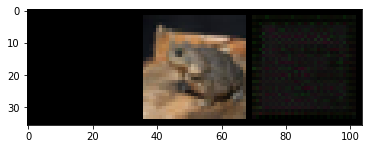

Training - Epoch 76
overall - overall_loss = 0.03207845985889435
generator - g_loss = 0.0070021445862948895
classifier - c_loss = 0.2577652335166931 acc = 0.9082


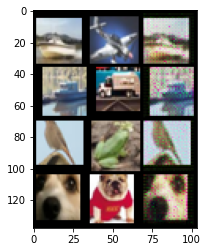

Testing - Epoch 76
overall - overall_loss = 0.6418840885162354
generator - g_loss = 0.0025247421581298113
classifier - c_loss = 0.6393594741821289 acc = 0.8141


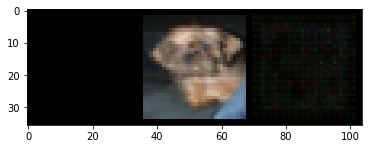

Training - Epoch 77
overall - overall_loss = 0.03137412667274475
generator - g_loss = 0.007229570299386978
classifier - c_loss = 0.24867524206638336 acc = 0.91004


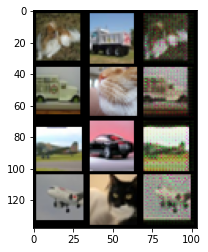

Testing - Epoch 77
overall - overall_loss = 0.6876608729362488
generator - g_loss = 0.008147495798766613
classifier - c_loss = 0.6795134544372559 acc = 0.8064


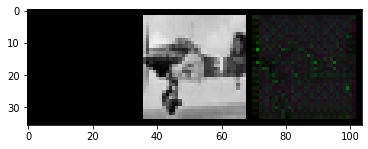

Training - Epoch 78
overall - overall_loss = 0.031191473826766014
generator - g_loss = 0.007024985738098621
classifier - c_loss = 0.24868962168693542 acc = 0.91192


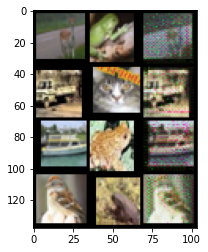

Testing - Epoch 78
overall - overall_loss = 0.6695687174797058
generator - g_loss = 0.006630724761635065
classifier - c_loss = 0.6629379391670227 acc = 0.8158


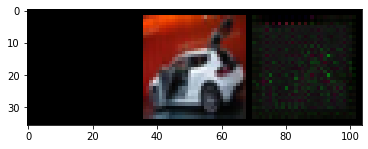

Training - Epoch 79
overall - overall_loss = 0.03154309466481209
generator - g_loss = 0.0070310235023498535
classifier - c_loss = 0.2521516680717468 acc = 0.91272


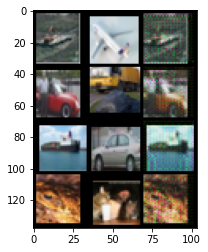

Testing - Epoch 79
overall - overall_loss = 0.6396538615226746
generator - g_loss = 0.004360001999884844
classifier - c_loss = 0.6352937817573547 acc = 0.8172


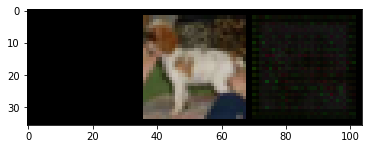

Training - Epoch 80
overall - overall_loss = 0.030646217986941338
generator - g_loss = 0.00716848811134696
classifier - c_loss = 0.24194559454917908 acc = 0.91292


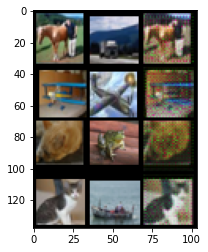

Testing - Epoch 80
overall - overall_loss = 0.7093627452850342
generator - g_loss = 0.003628210397437215
classifier - c_loss = 0.7057346105575562 acc = 0.8096


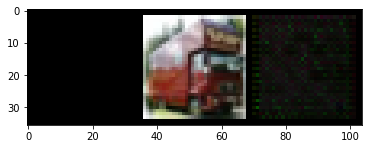

Training - Epoch 81
overall - overall_loss = 0.03019561618566513
generator - g_loss = 0.006882796064019203
classifier - c_loss = 0.2400108277797699 acc = 0.91384


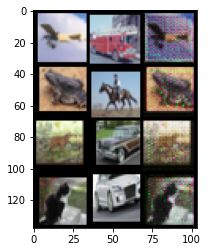

Testing - Epoch 81
overall - overall_loss = 0.7437974214553833
generator - g_loss = 0.003678192850202322
classifier - c_loss = 0.740119218826294 acc = 0.7982


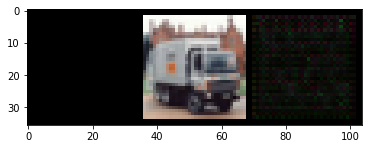

Training - Epoch 82
overall - overall_loss = 0.029503976926207542
generator - g_loss = 0.007186660077422857
classifier - c_loss = 0.23035985231399536 acc = 0.9196


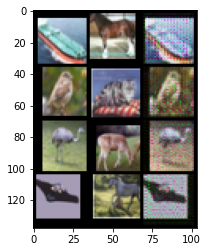

Testing - Epoch 82
overall - overall_loss = 0.666887640953064
generator - g_loss = 0.0057279751636087894
classifier - c_loss = 0.6611596345901489 acc = 0.8209


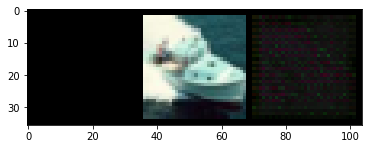

Training - Epoch 83
overall - overall_loss = 0.030420850962400436
generator - g_loss = 0.007155255414545536
classifier - c_loss = 0.23981128633022308 acc = 0.91532


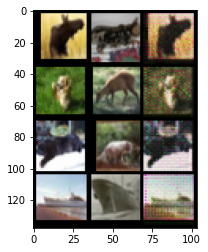

Testing - Epoch 83
overall - overall_loss = 0.6919327974319458
generator - g_loss = 0.005743120331317186
classifier - c_loss = 0.6861898303031921 acc = 0.8092


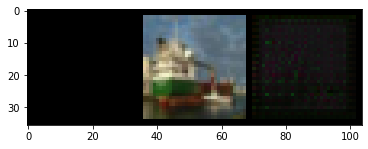

Training - Epoch 84
overall - overall_loss = 0.029686087742447853
generator - g_loss = 0.00700277928262949
classifier - c_loss = 0.2338360697031021 acc = 0.91796


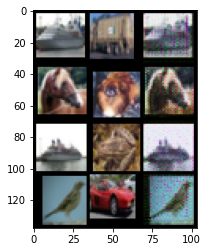

Testing - Epoch 84
overall - overall_loss = 0.6453900933265686
generator - g_loss = 0.007908450439572334
classifier - c_loss = 0.6374815106391907 acc = 0.827


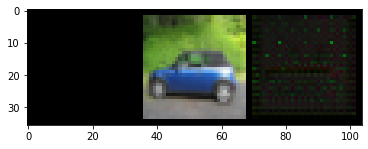

Training - Epoch 85
overall - overall_loss = 0.028338801115751266
generator - g_loss = 0.007144392933696508
classifier - c_loss = 0.2190885692834854 acc = 0.92236


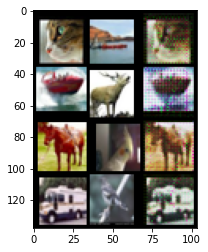

Testing - Epoch 85
overall - overall_loss = 0.6102779507637024
generator - g_loss = 0.005852002650499344
classifier - c_loss = 0.6044260263442993 acc = 0.8311
Save best checkpoint with overall loss 0.6102779507637024 - g_loss 0.005852002650499344 - c_loss 0.6044260263442993


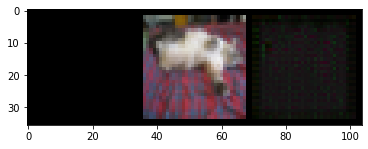

Training - Epoch 86
overall - overall_loss = 0.02911502681672573
generator - g_loss = 0.00716162845492363
classifier - c_loss = 0.22669556736946106 acc = 0.91928


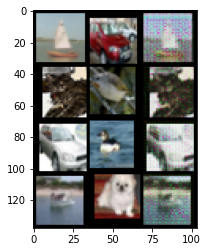

Testing - Epoch 86
overall - overall_loss = 0.6683605313301086
generator - g_loss = 0.006525508128106594
classifier - c_loss = 0.6618350744247437 acc = 0.817


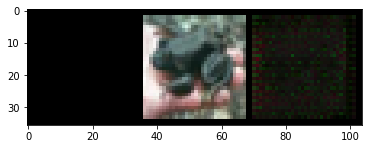

Training - Epoch 87
overall - overall_loss = 0.027787448838353157
generator - g_loss = 0.00701033603399992
classifier - c_loss = 0.21478135883808136 acc = 0.92296


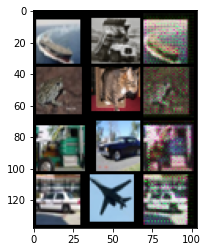

Testing - Epoch 87
overall - overall_loss = 0.7022014856338501
generator - g_loss = 0.0082276351749897
classifier - c_loss = 0.6939738988876343 acc = 0.8146


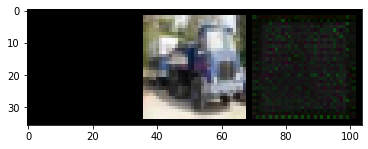

Training - Epoch 88
overall - overall_loss = 0.027366388589143753
generator - g_loss = 0.006766982842236757
classifier - c_loss = 0.2127610445022583 acc = 0.9268


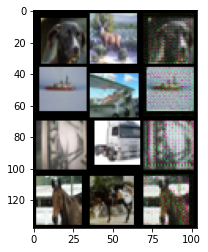

Testing - Epoch 88
overall - overall_loss = 0.717884361743927
generator - g_loss = 0.005928573198616505
classifier - c_loss = 0.711955726146698 acc = 0.8155


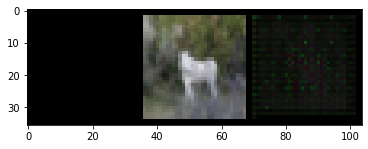

Training - Epoch 89
overall - overall_loss = 0.027276357635855675
generator - g_loss = 0.007166744209825993
classifier - c_loss = 0.20826290547847748 acc = 0.92652


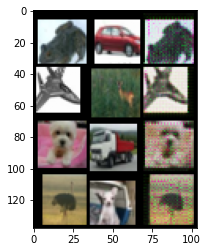

Testing - Epoch 89
overall - overall_loss = 0.7079631686210632
generator - g_loss = 0.005978839937597513
classifier - c_loss = 0.7019843459129333 acc = 0.8169


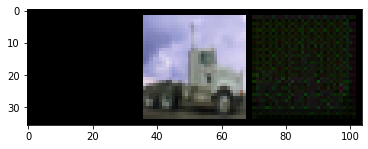

Training - Epoch 90
overall - overall_loss = 0.02650076150894165
generator - g_loss = 0.006977173965424299
classifier - c_loss = 0.20221289992332458 acc = 0.92788


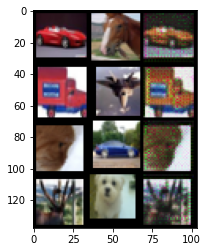

Testing - Epoch 90
overall - overall_loss = 0.7089701294898987
generator - g_loss = 0.0043595219030976295
classifier - c_loss = 0.7046105861663818 acc = 0.8171


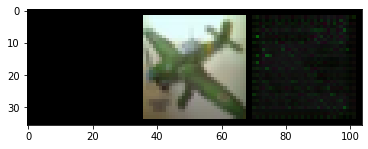

Training - Epoch 91
overall - overall_loss = 0.02752222679555416
generator - g_loss = 0.007264432031661272
classifier - c_loss = 0.2098424732685089 acc = 0.92636


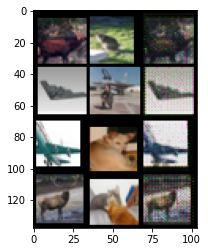

Testing - Epoch 91
overall - overall_loss = 0.6761801838874817
generator - g_loss = 0.005362384021282196
classifier - c_loss = 0.6708177328109741 acc = 0.822


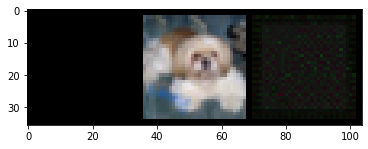

Training - Epoch 92
overall - overall_loss = 0.026331070810556412
generator - g_loss = 0.006942668929696083
classifier - c_loss = 0.20082661509513855 acc = 0.9292


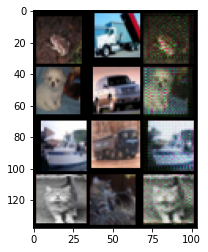

Testing - Epoch 92
overall - overall_loss = 0.6946008801460266
generator - g_loss = 0.0019584489054977894
classifier - c_loss = 0.692642331123352 acc = 0.8198


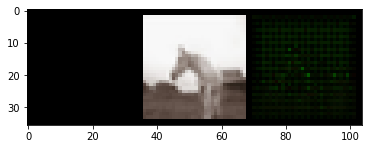

Training - Epoch 93
overall - overall_loss = 0.02553216926753521
generator - g_loss = 0.006960588973015547
classifier - c_loss = 0.19267623126506805 acc = 0.93244


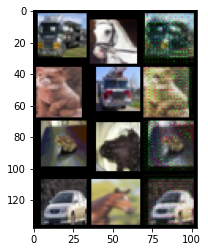

Testing - Epoch 93
overall - overall_loss = 0.7342714071273804
generator - g_loss = 0.0036754703614860773
classifier - c_loss = 0.7305958867073059 acc = 0.8091


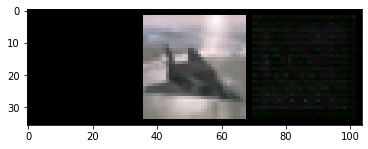

Training - Epoch 94
overall - overall_loss = 0.027434054762125015
generator - g_loss = 0.007379092741757631
classifier - c_loss = 0.20792876183986664 acc = 0.92528


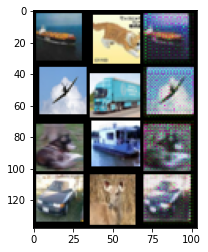

Testing - Epoch 94
overall - overall_loss = 0.6451681852340698
generator - g_loss = 0.005464524496346712
classifier - c_loss = 0.6397035717964172 acc = 0.8342


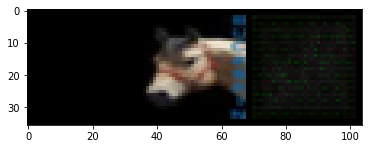

Training - Epoch 95
overall - overall_loss = 0.025487594306468964
generator - g_loss = 0.007205165922641754
classifier - c_loss = 0.19002938270568848 acc = 0.933


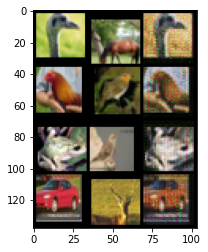

Testing - Epoch 95
overall - overall_loss = 0.6607254147529602
generator - g_loss = 0.0030293697491288185
classifier - c_loss = 0.6576961874961853 acc = 0.8315


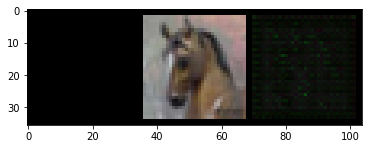

Training - Epoch 96
overall - overall_loss = 0.025322966277599335
generator - g_loss = 0.007085933815687895
classifier - c_loss = 0.18945620954036713 acc = 0.93432


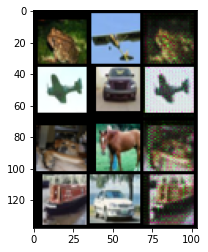

Testing - Epoch 96
overall - overall_loss = 0.7411612868309021
generator - g_loss = 0.0032123010605573654
classifier - c_loss = 0.7379488945007324 acc = 0.8108


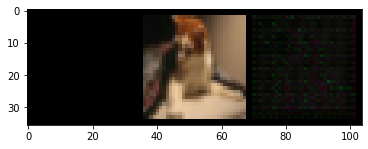

Training - Epoch 97
overall - overall_loss = 0.02546711079776287
generator - g_loss = 0.007277742028236389
classifier - c_loss = 0.18917138874530792 acc = 0.93392


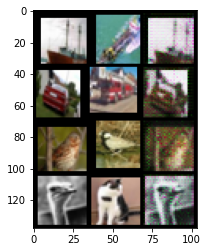

Testing - Epoch 97
overall - overall_loss = 0.6901283264160156
generator - g_loss = 0.004720475059002638
classifier - c_loss = 0.6854078769683838 acc = 0.8261


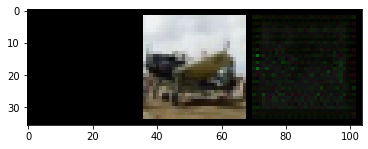

Training - Epoch 98
overall - overall_loss = 0.02487230859696865
generator - g_loss = 0.007100902963429689
classifier - c_loss = 0.18481488525867462 acc = 0.9364


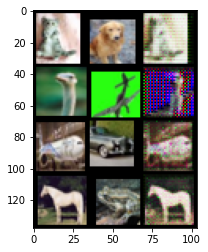

Testing - Epoch 98
overall - overall_loss = 0.6814113855361938
generator - g_loss = 0.006891700439155102
classifier - c_loss = 0.6745195984840393 acc = 0.8261


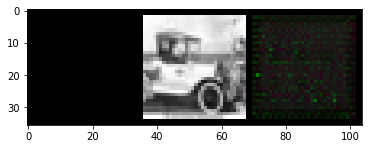

Training - Epoch 99
overall - overall_loss = 0.024608610197901726
generator - g_loss = 0.007141508162021637
classifier - c_loss = 0.18181249499320984 acc = 0.93684


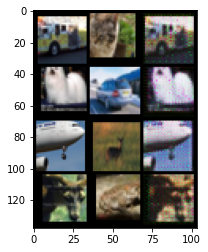

Testing - Epoch 99
overall - overall_loss = 0.7956152558326721
generator - g_loss = 0.0013947663828730583
classifier - c_loss = 0.7942206263542175 acc = 0.7872


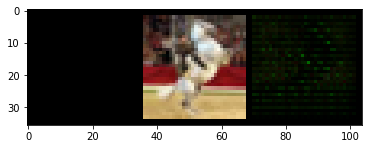

In [30]:
for epoch in range(100):
    train_end2end(train_loader, epoch, generator, classifier, mse_criterion, ce_criterion, cuda=True, show=True)
    test_end2end(test_loader, generator, classifier, ce_criterion, cuda=True, show=True)